<center><h1>Assignment 10(Day 10)</h1></center>

<h3>Question 1:- Firstly, replace all Missing values with relevant figures.</h3>

In [2]:
#Answer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import math

df = pd.read_csv('Dataset_Day8.csv')  # Creating data frame from the csv.

print(df.info())                      # Printing the information for the dataset.

# Checking for '0' values in the dataset.

value = df['Glucose'].value_counts()[0];
print(f'Number of zeros in Glucose = {value}')

value = df['BloodPressure'].value_counts()[0];
print(f'Number of zeros in Blood Pressure = {value}')

value = df['BMI'].value_counts()[0];
print(f'Number of zeros in BMI = {value}')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   BMI                       768 non-null    float64
 4   DiabetesPedigreeFunction  768 non-null    float64
 5   Age                       768 non-null    int64  
 6   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(5)
memory usage: 42.1 KB
None
Number of zeros in Glucose = 5
Number of zeros in Blood Pressure = 35
Number of zeros in BMI = 11


In [3]:
# Filling the zeros with mean of the values.

df['Glucose'] = df['Glucose'].replace(0, df['Glucose'].mean())
df['BloodPressure'] = df['BloodPressure'].replace(0, df['BloodPressure'].mean())
df['BMI'] = df['BMI'].replace(0, df['BMI'].mean())
df['DiabetesPedigreeFunction'] = df['DiabetesPedigreeFunction'].replace(0, df['DiabetesPedigreeFunction'].mean())

In [4]:
# Descriptive statistics for each columns.
statistics = df.describe()
print(statistics)

       Pregnancies     Glucose  BloodPressure         BMI  \
count   768.000000  768.000000     768.000000  768.000000   
mean      3.845052  121.681605      72.254807   32.450805   
std       3.369578   30.436016      12.115932    6.875374   
min       0.000000   44.000000      24.000000   18.200000   
25%       1.000000   99.750000      64.000000   27.500000   
50%       3.000000  117.000000      72.000000   32.000000   
75%       6.000000  140.250000      80.000000   36.600000   
max      17.000000  199.000000     122.000000   67.100000   

       DiabetesPedigreeFunction         Age     Outcome  
count                768.000000  768.000000  768.000000  
mean                   0.471876   33.240885    0.348958  
std                    0.331329   11.760232    0.476951  
min                    0.078000   21.000000    0.000000  
25%                    0.243750   24.000000    0.000000  
50%                    0.372500   29.000000    0.000000  
75%                    0.626250   41.000000 

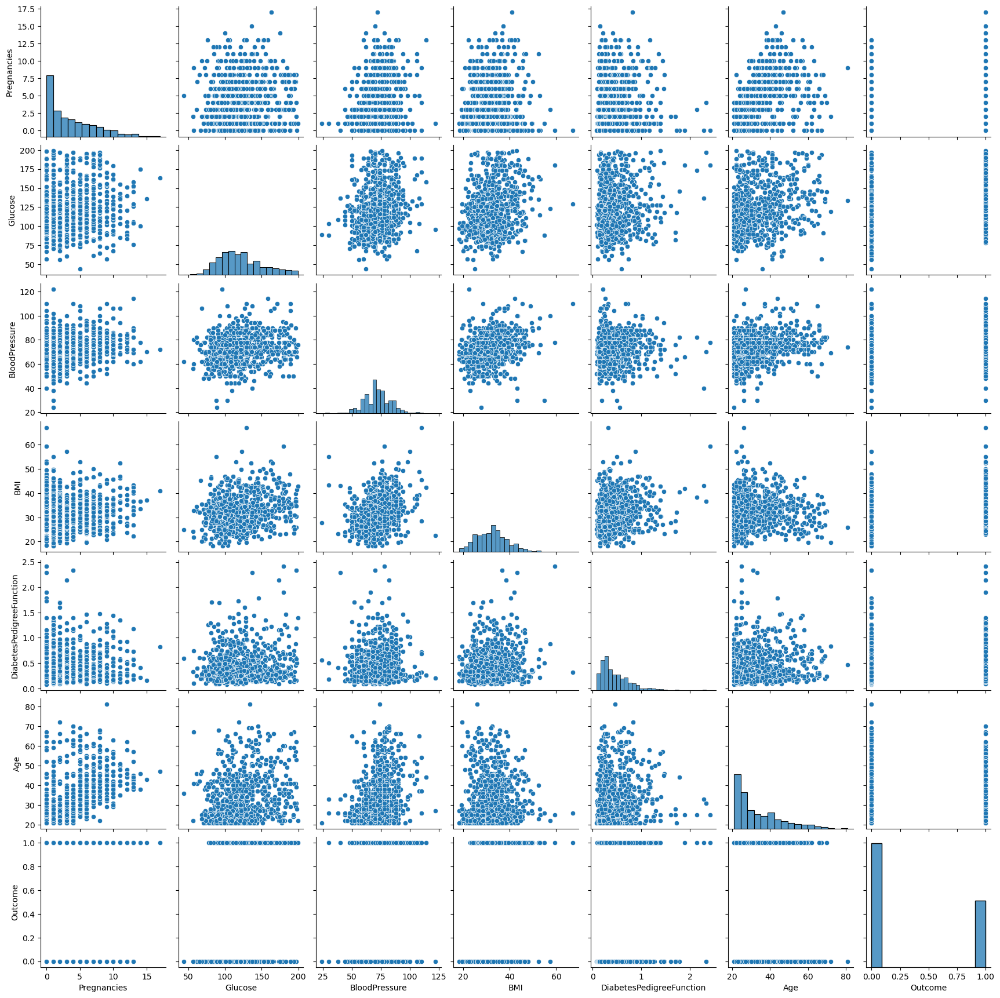

In [5]:
sns.pairplot(df)

<h3>Question 2:- Then remove all existing outliers and get the final data for classification.<h/h3>

<Axes: >

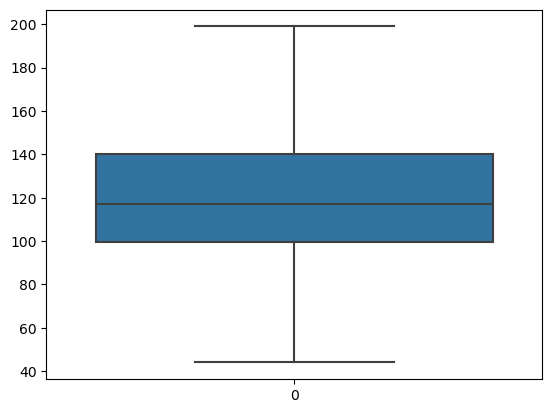

In [6]:
display(sns.boxplot(df["Glucose"]))      # Before Outlier Removal.

<Axes: >

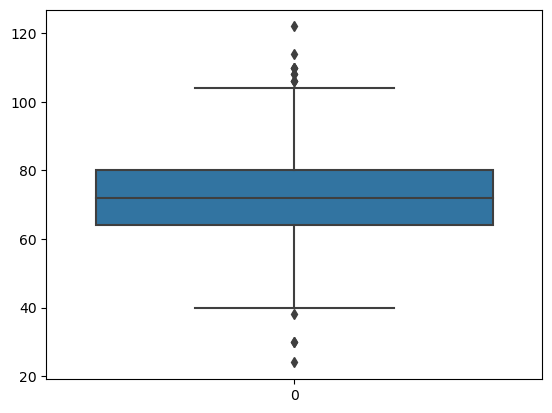

In [7]:
display(sns.boxplot(df["BloodPressure"]))

<Axes: >

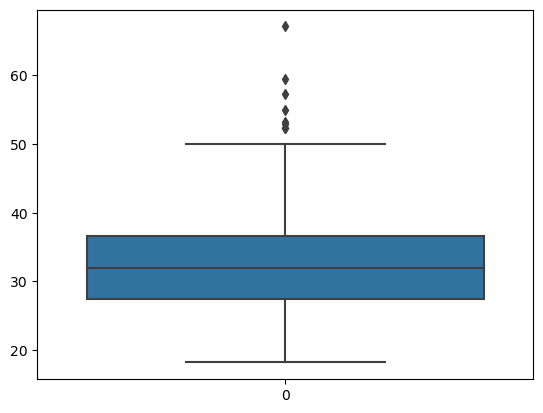

In [8]:
display(sns.boxplot(df["BMI"]))

<Axes: >

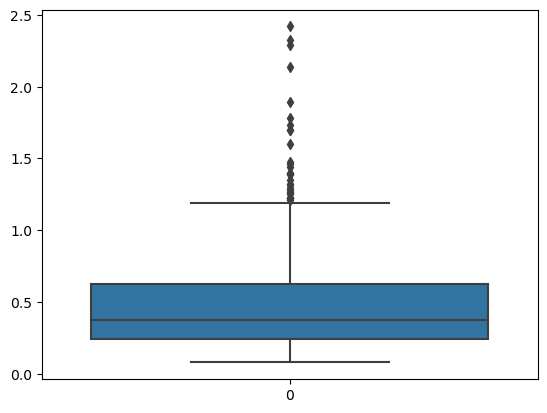

In [9]:
display(sns.boxplot(df["DiabetesPedigreeFunction"]))

In [10]:
# Removing the outliers from the 'Price' column

Q1 = df[['BMI', 'DiabetesPedigreeFunction', 'BloodPressure', 'Glucose']].quantile(0.25)
Q3 = df[['BMI', 'DiabetesPedigreeFunction', 'BloodPressure', 'Glucose']].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove the outliers from the DataFrame
df = df[
    (df['BMI'] >= lower_bound['BMI']) &
    (df['BMI'] <= upper_bound['BMI']) &
    (df['DiabetesPedigreeFunction'] >= lower_bound['DiabetesPedigreeFunction']) &
    (df['DiabetesPedigreeFunction'] <= upper_bound['DiabetesPedigreeFunction']) &
    (df['BloodPressure'] >= lower_bound['BloodPressure']) &
    (df['BloodPressure'] <= upper_bound['BloodPressure']) &
    (df['Glucose'] >= lower_bound['Glucose']) &
    (df['Glucose'] <= upper_bound['Glucose'])]

<Axes: >

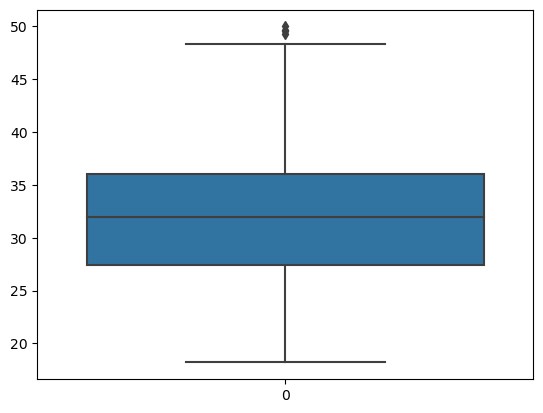

In [11]:
sns.boxplot(df['BMI'])    # After Removing the outliers.

<Axes: >

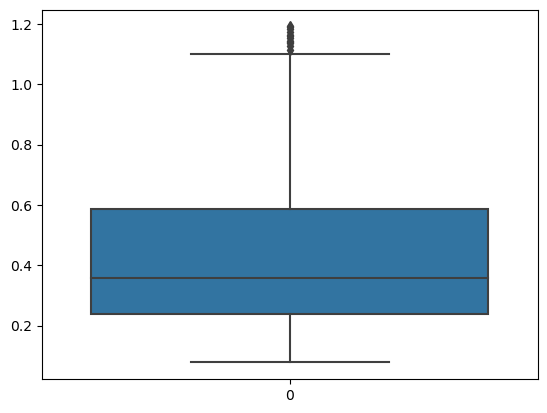

In [12]:
display(sns.boxplot(df["DiabetesPedigreeFunction"]))

<Axes: >

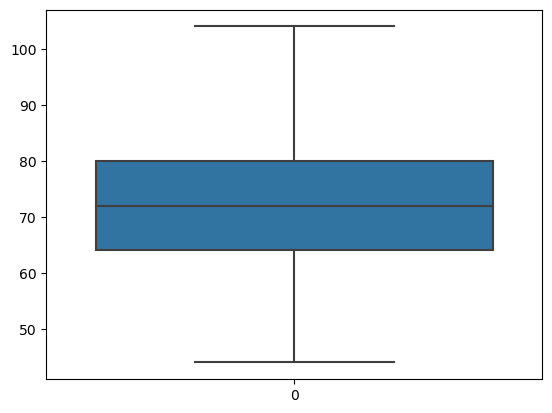

In [13]:
display(sns.boxplot(df["BloodPressure"]))

<Axes: >

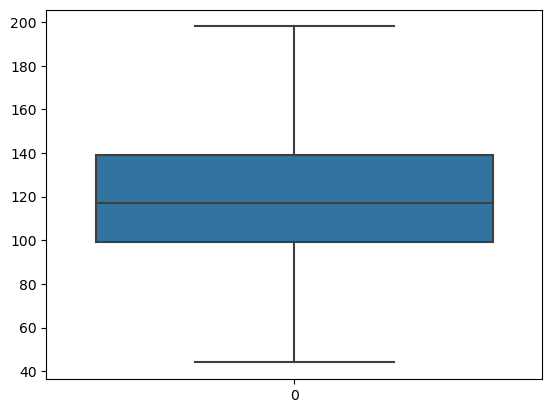

In [14]:
display(sns.boxplot(df["Glucose"]))

<h3>Question 3:-<br><br>3.	Split the data into 80% training and 20% testing data. Then, use a Decision Tree classifier algorithm with target variable as ‘Outcome’.<br><br>a.	Print the default model performance metrics: Accuracy, Precision, Recall, F1Score<br><br>b.	Plot a Precision & Recall vs max_leaf_nodes (consider a range of numbers) curve (both Prec and Rec on the same graph). Find the Crtiteria type for which F1-score is the highest.<br><br>c.	Plot a Precision & Recall vs max_depth (consider a range of numbers) curve (both Prec and Rec on the same graph). Find the Criteria type for which F1-score is the highest.
</h3>

In [15]:
df['Outcome'].value_counts(normalize=True)         # Testing the distribution in the target variable.

0    0.663889
1    0.336111
Name: Outcome, dtype: float64

<b>Since the values are not equally distributed hence Accuracy isnot a good performance measure. We rely on Prec, Rec and F1-Score.</b>

In [16]:
#Answer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Data Splitting

x = df.drop("Outcome",axis=1)        # Making the x dataframe with-out the 'Outcome' column.
y = df["Outcome"]                    # Making dataframe y from the 'Outcome' column of dataframe.

x_train,x_test, y_train, y_test = train_test_split(x,y,test_size = 0.20,random_state = 50)

In [17]:
#Answer 3(a)

# Create a Ddecision Tree Classifier

dt = DecisionTreeClassifier(random_state = 50)  # Default parameters. default criterion = 'gini'

dt = dt.fit(x_train,y_train)

y_pred = dt.predict(x_test)

model_accuracy = accuracy_score(y_test,y_pred)*100
prec_score = precision_score(y_test,y_pred)*100
rec_score = recall_score(y_test,y_pred)*100
f1_score = (2*prec_score*rec_score)/(prec_score+rec_score)

print("Model Accuracy  = {:.4f}%".format(model_accuracy))
print("Model Precision = {:.4f}%".format(prec_score))
print("Model Recall    = {:.4f}%".format(rec_score))
print("Model F1-Score  = {:.4f}%".format(f1_score))

Model Accuracy  = 61.1111%
Model Precision = 43.5897%
Model Recall    = 33.3333%
Model F1-Score  = 37.7778%


<b>From this default Decision Tree Classifer we can observe that the F1-Score is about 37.77 %.</b>

In [18]:
from sklearn import tree

plt.figure(figsize = (250,150))
tree.plot_tree(dt, feature_names = list(x.columns), class_names = ['0','1'],filled = True,fontsize=50);

<b>Vizualization of the default Descision Tree is above.</b>

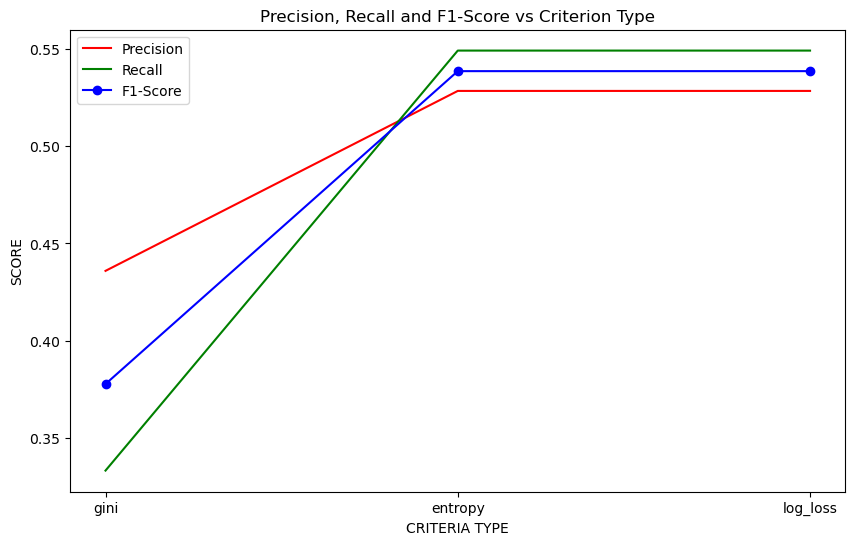

Criteria Type with the highest F1-Score:  ENTROPY
Best F1-Score Value:  53.84615384615385


In [26]:
# Define the criterion types and initialize empty lists to store the precision, recall, and F1-score values
criterion_types = ['gini','entropy','log_loss']

precision_scores = []
recall_scores = []
f1_scores = []

# Iterate over the criterion types and calculate precision, recall, and F1-score
for c in criterion_types:
    dt = DecisionTreeClassifier(random_state = 50,criterion=c)
    dt = dt.fit(x_train,y_train)
    y_pred = dt.predict(x_test)

    model_accuracy = accuracy_score(y_test,y_pred)*100
    prec_score = precision_score(y_test,y_pred)*100
    rec_score = recall_score(y_test,y_pred)*100
    f1_score = (2*prec_score*rec_score)/(prec_score+rec_score)
    
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = (2*precision*recall)/(precision+recall)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Plotting Precision, Recall, and F1-Score curves
plt.figure(figsize=(10, 6))
plt.plot(criterion_types, precision_scores, label='Precision',color='red')
plt.plot(criterion_types, recall_scores, label='Recall',color='green')
plt.plot(criterion_types, f1_scores,marker='o', label='F1-Score',color='blue')
plt.xlabel('Criteria Type'.upper())
plt.ylabel('Score'.upper())
plt.title('Precision, Recall and F1-Score vs Criterion Type')
plt.legend()
plt.show()

# Finding the criterion type with the highest F1-score
max_f1_score = max(f1_scores)
best_kernel = criterion_types[f1_scores.index(max_f1_score)]
print("Criteria Type with the highest F1-Score: ", best_kernel.upper())
print("Best F1-Score Value: ",max_f1_score*100)

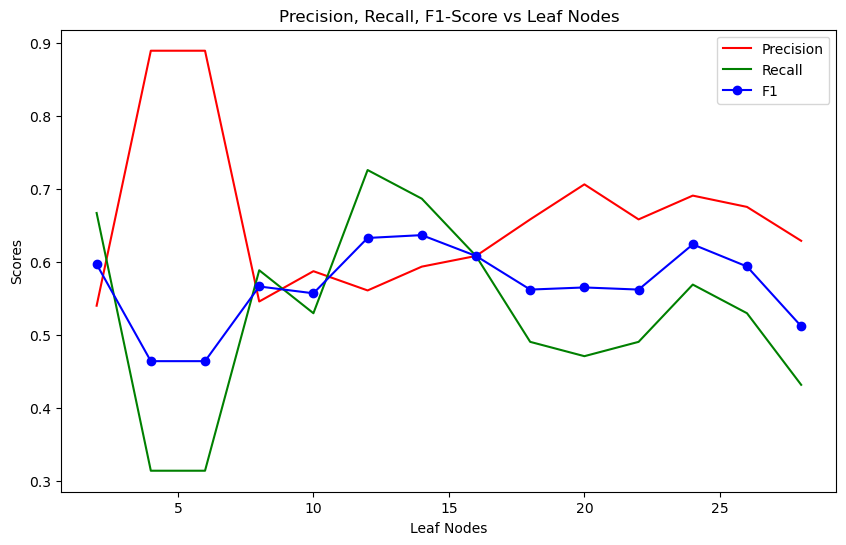

Max Leaf Nodes of 14 for F1-Score: 63.63636363636363


In [27]:
#Answer 3(b)
max_leaf_nodes = np.arange(2,30).tolist()[0::2]

precisions = []
recalls = []
f1_scores = []

for n in max_leaf_nodes:
    dt = DecisionTreeClassifier(max_leaf_nodes=n, random_state=50, criterion = 'entropy')
    dt.fit(x_train, y_train)
    y_pred = dt.predict(x_test)
    
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)

    f1 = (2 * precision * recall)/(precision + recall)
  
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)

    # Plotting the graphs for Recall,Precision, F1-Score vs Max Leaf Nodes.
plt.figure(figsize=(10, 6))
plt.plot(max_leaf_nodes, precisions, label='Precision',color='red')
plt.plot(max_leaf_nodes, recalls, label='Recall',color='green')
plt.plot(max_leaf_nodes, f1_scores, label='F1',color='blue',marker='o')

plt.xlabel('Leaf Nodes')
plt.ylabel('Scores')
plt.title('Precision, Recall, F1-Score vs Leaf Nodes')
plt.legend()
plt.show()

best_f1_score = max(f1_scores)
best_max_leaf_nodes = max_leaf_nodes[f1_scores.index(best_f1_score)]
print(f"Max Leaf Nodes of {best_max_leaf_nodes} for F1-Score: {best_f1_score*100}")

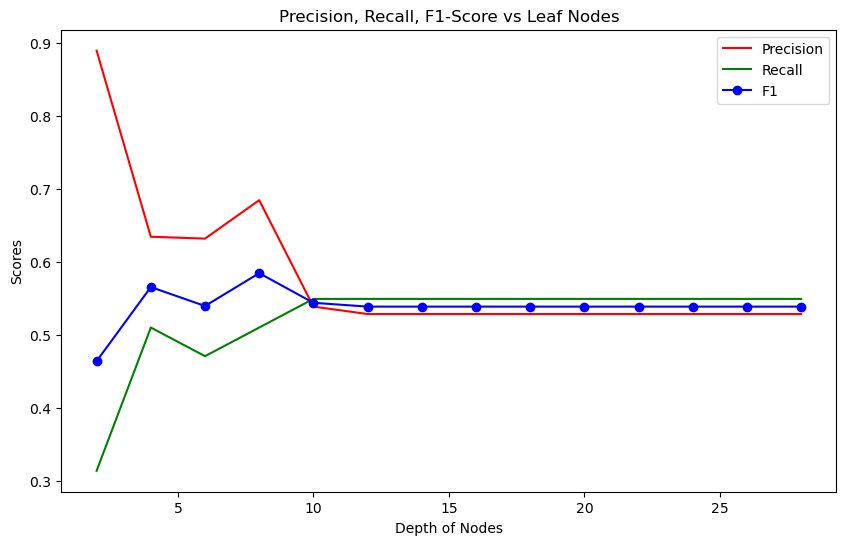

Max Depth of 8 for F1-Score: 58.42696629213484


In [28]:
#Answer 3(c)
max_depth = np.arange(2,30).tolist()[0::2]

precisions = []
recalls = []
f1_scores = []

for d in max_depth:
    dt = DecisionTreeClassifier(max_depth = d, random_state=50, criterion = 'entropy')
    dt.fit(x_train, y_train)
    y_pred = dt.predict(x_test)
    
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)

    f1 = (2 * precision * recall)/(precision + recall)
  
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)

    # Plotting the graphs for Recall,Precision, F1-Score vs Max Depth.
plt.figure(figsize=(10, 6))
plt.plot(max_depth, precisions, label='Precision',color='red')
plt.plot(max_depth, recalls, label='Recall',color='green')
plt.plot(max_depth, f1_scores, label='F1',color='blue',marker='o')

plt.xlabel('Depth of Nodes')
plt.ylabel('Scores')
plt.title('Precision, Recall, F1-Score vs Leaf Nodes')
plt.legend()
plt.show()

best_f1_score = max(f1_scores)
best_max_depth = max_leaf_nodes[f1_scores.index(best_f1_score)]
print(f"Max Depth of {best_max_depth} for F1-Score: {best_f1_score*100}")

In [23]:
# Tuning all the different parameters.

criterion = ['gini','entropy','log_loss']               # List with possible criterions.
max_depth = np.arange(1,30).tolist()[0::2]              # List with maximum depth of tree.
min_samples_split = np.arange(2,11).tolist()[0::2]      # List with minimum sample splits.
max_leaf_nodes = np.arange(3,26).tolist()[0::2]         # List with maximum leaf nodes.
splitter_type = ['best','random']                       # List with splitter type parameters.

PerfData = pd.DataFrame(columns=['Criterion','Max Tree Depth','Max Leaf Nodes','Min Sample Split','Splitter Type','Precision','Recall','Accuracy','F1-Score'])

for c in criterion:
    for s_type in splitter_type:
        for sp in min_samples_split:
            for md in max_depth:
                for mln in max_leaf_nodes:
                    dt = DecisionTreeClassifier(criterion = c, max_depth = md, max_leaf_nodes = mln, min_samples_split = sp, splitter = s_type, random_state = 50)

                    dt = dt.fit(x_train,y_train)
                    y_pred = dt.predict(x_test)
                    
                    p = precision_score(y_test,y_pred)
    
                    r = recall_score(y_test,y_pred)

                    acc = accuracy_score(y_test,y_pred)

                    f1 = (2 * p * r)/(p + r)
                    
                    row = [[c, md, mln,sp,s_type,p,r,acc,f1]]

                    PerfData = PerfData.append(
                        pd.DataFrame(row, columns = ['Criterion','Max Tree Depth','Max Leaf Nodes','Min Sample Split','Splitter Type','Precision','Recall','Accuracy','F1-Score']),ignore_index=True)

# Finding the criterion type with the highest F1-score
value=PerfData['F1-Score'].idxmax()
display(PerfData.loc[[value]])

,Criterion,Max Tree Depth,Max Leaf Nodes,Min Sample Split,Splitter Type,Precision,Recall,Accuracy,F1-Score
1831,entropy,5,17,2,best,0.585714,0.803922,0.729167,0.677686


In [24]:
display(PerfData.loc[[value]])

,Criterion,Max Tree Depth,Max Leaf Nodes,Min Sample Split,Splitter Type,Precision,Recall,Accuracy,F1-Score
1831,entropy,5,17,2,best,0.585714,0.803922,0.729167,0.677686


<b>The highest F1-Score acheived was 67.76 % as above.</b>

In [25]:
display(PerfData[PerfData['F1-Score']==max(PerfData['F1-Score'])])

,Criterion,Max Tree Depth,Max Leaf Nodes,Min Sample Split,Splitter Type,Precision,Recall,Accuracy,F1-Score
1831,entropy,5,17,2,best,0.585714,0.803922,0.729167,0.677686
2011,entropy,5,17,4,best,0.585714,0.803922,0.729167,0.677686
2191,entropy,5,17,6,best,0.585714,0.803922,0.729167,0.677686
2371,entropy,5,17,8,best,0.585714,0.803922,0.729167,0.677686
2551,entropy,5,17,10,best,0.585714,0.803922,0.729167,0.677686
3631,log_loss,5,17,2,best,0.585714,0.803922,0.729167,0.677686
3811,log_loss,5,17,4,best,0.585714,0.803922,0.729167,0.677686
3991,log_loss,5,17,6,best,0.585714,0.803922,0.729167,0.677686
4171,log_loss,5,17,8,best,0.585714,0.803922,0.729167,0.677686
4351,log_loss,5,17,10,best,0.585714,0.803922,0.729167,0.677686
